In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import pycocotools
import os
dir = r'/content/drive/MyDrive/MAV Assignment/pytorch object detection/vision/references/detection'
os.chdir(dir)

In [3]:
#!git clone https://github.com/pytorch/vision.git

In [4]:
import numpy as np
import torch
import torch.utils.data
import torch.nn as nn
import PIL
from PIL import Image, ImageDraw
import pandas as pd
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator
from engine import train_one_epoch, evaluate
import utils
import os,sys
import transforms as T
import IPython.display
import time

In [5]:
#Read the csv file to generate a list of bounding box coordinates
def parse_one_annot(path_to_data_file, filename):
    data = pd.read_csv(path_to_data_file)
    boxes_array = data[data["filename"] == filename][["x1", "y1",      
   "x3", "y3"]].values
    return boxes_array

In [6]:
class GateDataset(torch.utils.data.Dataset):
    def __init__(self, root, data_file, transforms=None):
        
        self.root = root
        self.transforms = transforms
        self.imgs = sorted(os.listdir(self.root))
        self.path_to_data_file = data_file     
       

    def __getitem__(self, idx):
        
        # load images and bounding boxes
          
        img_path = os.path.join(self.root, self.imgs[idx])
        img = Image.open(img_path).convert("RGB")
        draw = ImageDraw.Draw(img)
        box_list = parse_one_annot(self.path_to_data_file,self.imgs[idx])
        boxes = torch.as_tensor(box_list, dtype=torch.float32)
        num_objs = len(box_list)
        labels = torch.ones((num_objs,), dtype=torch.int64)
        image_id = torch.tensor([idx])
        #Calculate the Area of the bounding boxes
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:,0])

        # suppose all instances are not crowd
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd
        if self.transforms is not None:
            img, target = self.transforms(img, target)
         
        return img, target  
    
    def __len__(self):
        return len(self.imgs)
             

In [7]:
dataset = GateDataset(root= r"/content/drive/MyDrive/MAV Assignment/images/train",
data_file= r"/content/drive/MyDrive/MAV Assignment/images/train_corners.csv")
#Inspect the dataset items to ensure they have been loaded correctly
dataset.__getitem__(1)

(<PIL.Image.Image image mode=RGB size=335x360 at 0x7FCA8E479950>,
 {'area': tensor([4575., 1320.]), 'boxes': tensor([[ 97., 201., 172., 262.],
          [ 22., 219.,  62., 252.]]), 'image_id': tensor([1]), 'iscrowd': tensor([0, 0]), 'labels': tensor([1, 1])})

In [8]:
def get_model(num_classes):
    
    #Using a vgg16 backbone in the FasterRCNN
    backbone = torchvision.models.vgg16(pretrained=True).features
    backbone.out_channels = 512

    anchor_generator = AnchorGenerator(sizes=(( 64, 128,256),),
                                   aspect_ratios=((0.5, 1.0, 2.0),))
    
    roi_pooler = torchvision.ops.MultiScaleRoIAlign(featmap_names=["0"],
                                                output_size=7,
                                                sampling_ratio=2)
    
    model = FasterRCNN(backbone,num_classes=2,
                      rpn_anchor_generator=anchor_generator,
                      box_roi_pool=roi_pooler)
    
    #To change the model from vgg16 to resnet50
    '''
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
    # get the number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new on
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features,num_classes=2)
    '''
    return model

In [9]:

def get_transform(train):
    
    
    transform_list = []
    # converts the image, a PIL image, into a PyTorch Tensor
    transform_list.append(T.ToTensor())
    if train:
      transform_list.append(T.RandomHorizontalFlip(0.5))
        
      # during training, randomly flip the training images
      # and ground-truth for data augmentation
          
    return T.Compose(transform_list)

In [10]:
dataset = GateDataset(root= r"/content/drive/MyDrive/MAV Assignment/images/train",
data_file= r"/content/drive/MyDrive/MAV Assignment/images/train_corners.csv",transforms = get_transform(train=True))

dataset_test = GateDataset(root= r"/content/drive/MyDrive/MAV Assignment/images/test",
          data_file= r"/content/drive/MyDrive/MAV Assignment/images/test_corners.csv",
               transforms = get_transform(train=False))

torch.manual_seed(1)
indices = torch.randperm(len(dataset)).tolist()

#Can be used to geenrate smaller dataset subsets for particularly large datasets
dataset_subset = torch.utils.data.Subset(dataset,indices)

data_loader = torch.utils.data.DataLoader(dataset_subset, batch_size=1, shuffle=True, num_workers=0,
                                          collate_fn=utils.collate_fn)

indices_test = torch.randperm(len(dataset_test)).tolist()

dataset_subset_test = torch.utils.data.Subset(dataset_test,indices_test)

data_loader_test = torch.utils.data.DataLoader(
         dataset_test, batch_size=1, shuffle=False, num_workers=0,
         collate_fn=utils.collate_fn)

print("Train dataset: ", len(data_loader), " \nTest dataset length",len(dataset_subset_test))

Train dataset:  241  
Test dataset length 50


In [11]:
torch.cuda.is_available()

True

In [12]:
device = torch.device('cuda:0')
# our dataset has two classes only - gate and not gate
num_classes = 2
# get the model using our helper function
model = get_model(num_classes)
# move model to the right device
model.to(device)
# construct an optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005,
                            momentum=0.9, weight_decay=0.0005)
# and a learning rate scheduler which decreases the learning rate by # 10x every 10 epochs
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,step_size=10,gamma=0.1)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


In [22]:
evaluate(model, data_loader_test, device=device)

creating index...
index created!
Test:  [ 0/50]  eta: 0:00:06  model_time: 0.1147 (0.1147)  evaluator_time: 0.0014 (0.0014)  time: 0.1268  data: 0.0102  max mem: 491
Test:  [49/50]  eta: 0:00:00  model_time: 0.1073 (0.1071)  evaluator_time: 0.0012 (0.0012)  time: 0.1209  data: 0.0121  max mem: 491
Test: Total time: 0:00:06 (0.1210 s / it)
Averaged stats: model_time: 0.1073 (0.1071)  evaluator_time: 0.0012 (0.0012)
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.694
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.945
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.814
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.504
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.720
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.881
 Average Recall     (AR) @[ IoU=0.

In [15]:
num_epochs = 100
#torch.cuda.empty_cache()
for epoch in range(num_epochs):

   # train for one epoch, printing every 100 iterations
    torch.cuda.empty_cache()
    train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=100)
    # update the learning rate
    lr_scheduler.step()
    
    if (epoch%10)==0:
      torch.save(model.state_dict(), r"/content/drive/MyDrive/MAV Assignment/pytorch object detection/models/vgg16")
    
    if (epoch%10)==0:
      evaluate(model, data_loader_test, device=device)

torch.save(model.state_dict(), r"/content/drive/MyDrive/MAV Assignment/pytorch object detection/models/vgg16")
# evaluate on the test dataset
evaluate(model, data_loader_test, device=device)

Epoch: [0]  [  0/241]  eta: 0:04:17  lr: 0.000026  loss: 1.4909 (1.4909)  loss_classifier: 0.7256 (0.7256)  loss_box_reg: 0.0249 (0.0249)  loss_objectness: 0.7115 (0.7115)  loss_rpn_box_reg: 0.0288 (0.0288)  time: 1.0700  data: 0.0435  max mem: 1519
Epoch: [0]  [100/241]  eta: 0:01:52  lr: 0.002107  loss: 0.2365 (0.6959)  loss_classifier: 0.0908 (0.2315)  loss_box_reg: 0.0906 (0.0505)  loss_objectness: 0.0509 (0.3866)  loss_rpn_box_reg: 0.0085 (0.0273)  time: 0.8177  data: 0.0214  max mem: 1876
Epoch: [0]  [200/241]  eta: 0:00:32  lr: 0.004188  loss: 0.1440 (0.4534)  loss_classifier: 0.0367 (0.1441)  loss_box_reg: 0.0380 (0.0607)  loss_objectness: 0.0557 (0.2270)  loss_rpn_box_reg: 0.0079 (0.0216)  time: 0.8121  data: 0.0241  max mem: 1876
Epoch: [0]  [240/241]  eta: 0:00:00  lr: 0.005000  loss: 0.2235 (0.4190)  loss_classifier: 0.0445 (0.1290)  loss_box_reg: 0.0557 (0.0595)  loss_objectness: 0.0901 (0.2056)  loss_rpn_box_reg: 0.0090 (0.0248)  time: 0.8083  data: 0.0240  max mem: 1876


KeyboardInterrupt: ignored

In [13]:
loaded_model = get_model(num_classes = 2)
loaded_model.load_state_dict(torch.load(r"/content/drive/MyDrive/MAV Assignment/pytorch object detection/models/vgg16"))

<All keys matched successfully>

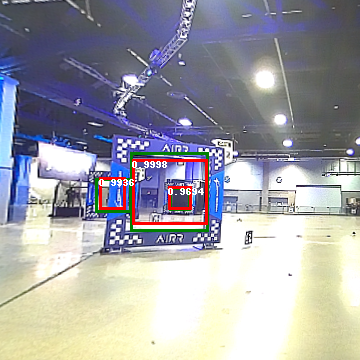

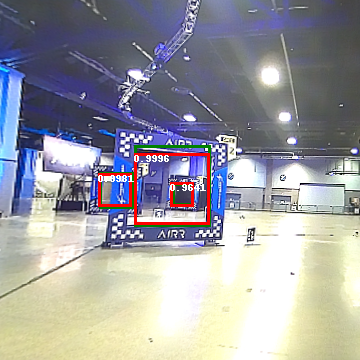

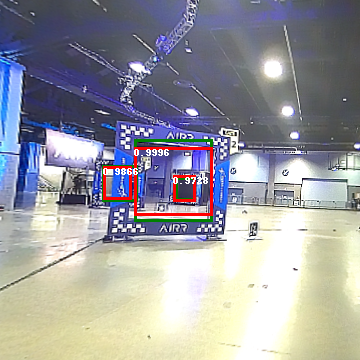

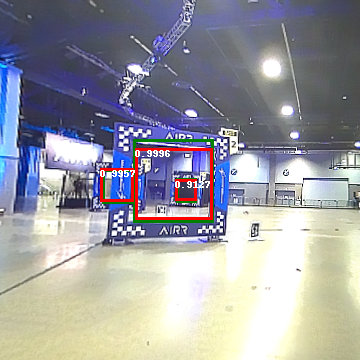

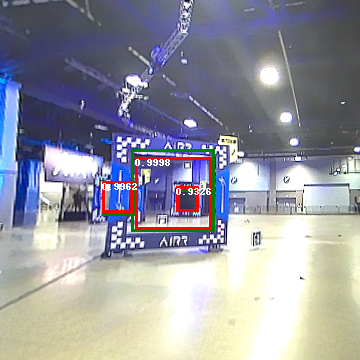

...

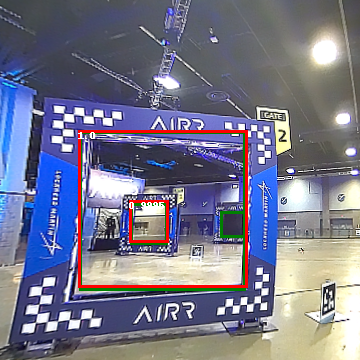

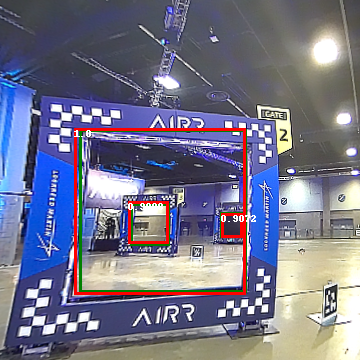

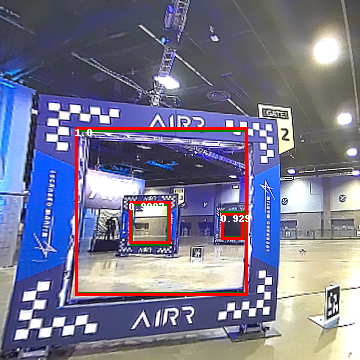

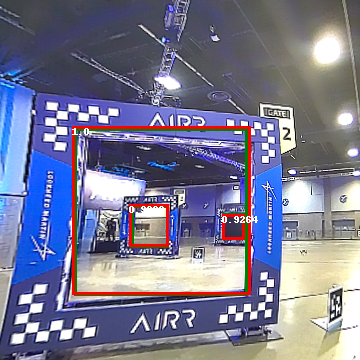

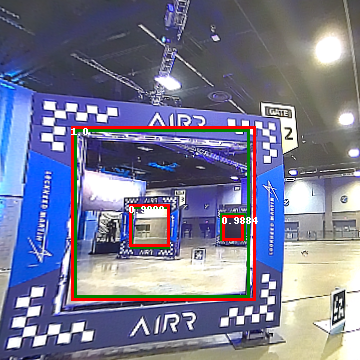

Time per image: 6.162597398757935


In [19]:
start = time.time()
for idx in range(0,50):

  img, _ = dataset_test[idx]
  label_boxes = np.array(dataset_test[idx][1]["boxes"])
  #put the model in evaluation mode
  loaded_model.eval()
  with torch.no_grad():
    prediction = loaded_model([img])
  image = Image.fromarray(img.mul(255).permute(1, 2,0).byte().numpy())
  draw = ImageDraw.Draw(image)
  # draw groundtruth
  for elem in range(len(label_boxes)):
    draw.rectangle([(label_boxes[elem][0], label_boxes[elem][1]),
    (label_boxes[elem][2], label_boxes[elem][3])], 
    outline ="green", width =3)

  for element in range(len(prediction[0]["boxes"])):
    boxes = prediction[0]["boxes"][element].cpu().numpy()
    score = np.round(prediction[0]["scores"][element].cpu().numpy(),
                      decimals= 4)
    #Only draw boxes above a certain threshold
    if score > 0.8:
        draw.rectangle([(boxes[0], boxes[1]), (boxes[2], boxes[3])], 
        outline ="red", width =3)
        draw.text((boxes[0], boxes[1]), text = str(score))

  display(image)

end = time.time()
print("Time per image:",(end-start)/50)